### Bryan Jamieson
#### BAMTESTING - https://www.bamtesting.com/bamscore
#### Data From Martin (Head Data Scientist) @ Bamtesting

# Business Case:
### - Can I predict BAMscore using NBA Combine Test Results or use it as a predictor to understand which of the 12 athletic tests actually can improve bamscore?
### - How can it give insight to athletes + coaches?
## Hypothesis
### - Protocols (specifically 2 agility tests) are more important for predicting and or improving bamscore, athletes need to focus on improving those

## Target Audience
### = High School Basketball Athletes that are trying to plan and play at next level

# DATA Explained

bamid
- Number randomly assigned to each athlete without knowing full name

bamscore
- Single Numerical Value that measures and benchmarks athletic performence
- "Athletic SAT Score"
- Standardized athletic assessment that gives coaches insight into where players need improvement

## Protocols (Athletic Tests)
approach_vertical
- running start, jump as high as you can

vertical_jump
- stationary start, jump as high as you can

three_quarter_court_sprint
- 75 ft straight sprint

four_way_agility
- run arouund 4 points in box, run back through

reaction_shuttle
- agility test - start in middle of box, run left, right, run back and finish through left line          

## Anthros (Body Measurements)
wingspan
- horizontal distance from arms extended side to side

reach
- standing vertical reach

height
- how tall you are in inches

weight
- how much you weigh in pounds

body_comp
- body fat (varies in measurement methods)

hand_length
- vertical length of hand

hand_width
- horizontal length of hand

# Flow

## Notebook (1) Explore and Clean BAM Data
#### - Visualize the data to see trends, relationships, outliers
#### - Clean Outliers
#### - Make Observation/Hypothesis
#### - Save as "clean data"

## Notebook (2) Modeling
#### - Model data in modeling notebook (2)
#### - Try different regressions and models
#### - Iterate to improve r2 score without over fitting

# 1) Import Libraries + Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as scs
import seaborn as sns
import os
import plotly.express as px
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import maxabs_scale
from sklearn.pipeline import Pipeline

In [2]:
df = pd.read_excel('bam_testing_data.xlsx')
## Name the dataset "df"

In [3]:
df.info()
# See if anything is funky with the data using .info() and the eye test

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 16 columns):
BAMid                 1057 non-null object
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1026 non-null object
4-Way agility         1020 non-null object
Reaction Shuttle      1024 non-null float64
BAMScore              1056 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Length           1010 non-null float64
Hand Width            1009 non-null float64
Unnamed: 14           0 non-null float64
Unnamed: 15           1 non-null object
dtypes: float64(12), object(4)
memory usage: 132.5+ KB


In [4]:
df

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Length,Hand Width,Unnamed: 14,Unnamed: 15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.00,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.50,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.00,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.50,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.00,180.0,15.4,8.00,10.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1054,574,36.0,31.0,3.424,12.654,3.635,1917.0,72.00,88.0,68.25,147.4,7.9,8.00,8.50,NaN,NaN
1055,651,31.5,26.5,3.256,11.136,3.343,2029.0,74.00,91.5,68.00,172.1,23.4,7.00,8.50,NaN,NaN
1056,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1057,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Observation - This shows we have 1059 rows and 16 columns
#### I dont like the looks of Unnamed 14 + 15. Replace spaces with _ for punctuation purposes

In [5]:
df.columns = [column.strip().lower().replace(" ", "_") for column in df.columns]
df.head()

,bamid,approach_vertical,vertical_jump,3/4_court_sprint,4-way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width,unnamed:_14,unnamed:_15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00,NaN,NaN


#### Have to change spaces (strings) to numberic values to we can work with it
#### Fill spaces/na with 0 so we can fill with mean later

In [6]:
column_names = ['bamid', '3/4_court_sprint', '4-way_agility', 'unnamed:_14', 'unnamed:_15']

for column in df.columns:
    if column in column_names:
        df[column].replace('', 0)
        df[column] = pd.to_numeric(df[column], errors='coerce')
    df[column].fillna(df[column].mean(), inplace=True)
    print(f'{column}: fixed!')
# Have to change spaces (strings) to numberic values to we can work with it

bamid: fixed!
approach_vertical: fixed!
vertical_jump: fixed!
3/4_court_sprint: fixed!
4-way_agility: fixed!
reaction_shuttle: fixed!
bamscore: fixed!
wingspan: fixed!
reach: fixed!
height: fixed!
weight: fixed!
body_comp: fixed!
hand_length: fixed!
hand_width: fixed!
unnamed:_14: fixed!
unnamed:_15: fixed!


In [7]:
df.columns

Index(['bamid', 'approach_vertical', 'vertical_jump', '3/4_court_sprint',
       '4-way_agility', 'reaction_shuttle', 'bamscore', 'wingspan', 'reach',
       'height', 'weight', 'body_comp', 'hand_length', 'hand_width',
       'unnamed:_14', 'unnamed:_15'],
      dtype='object')

In [8]:
df.rename(columns = {'3/4_court_sprint':'three_quarter_court_sprint', '4-way_agility':'four_way_agility'}
          , inplace = True)
# rename columns so they all work later on in notebook

In [9]:
df.drop(columns=['unnamed:_14','unnamed:_15','bamid'],inplace=True)
# Remove because only 1 value from our df.info check above
# Check df.info() again to make sure it worked

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 13 columns):
approach_vertical             1059 non-null float64
vertical_jump                 1059 non-null float64
three_quarter_court_sprint    1059 non-null float64
four_way_agility              1059 non-null float64
reaction_shuttle              1059 non-null float64
bamscore                      1059 non-null float64
wingspan                      1059 non-null float64
reach                         1059 non-null float64
height                        1059 non-null float64
weight                        1059 non-null float64
body_comp                     1059 non-null float64
hand_length                   1059 non-null float64
hand_width                    1059 non-null float64
dtypes: float64(13)
memory usage: 107.7 KB


In [11]:
df.columns.isna()
# Check and make sure nulls are gone - looking for all false.

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False])

# Data Visualization + EDA

### What does our data even look like?
#### First lets create a simple pairplot to:
##### - Use the eye test to look at relationships in our data
##### - Identify multicollinearity

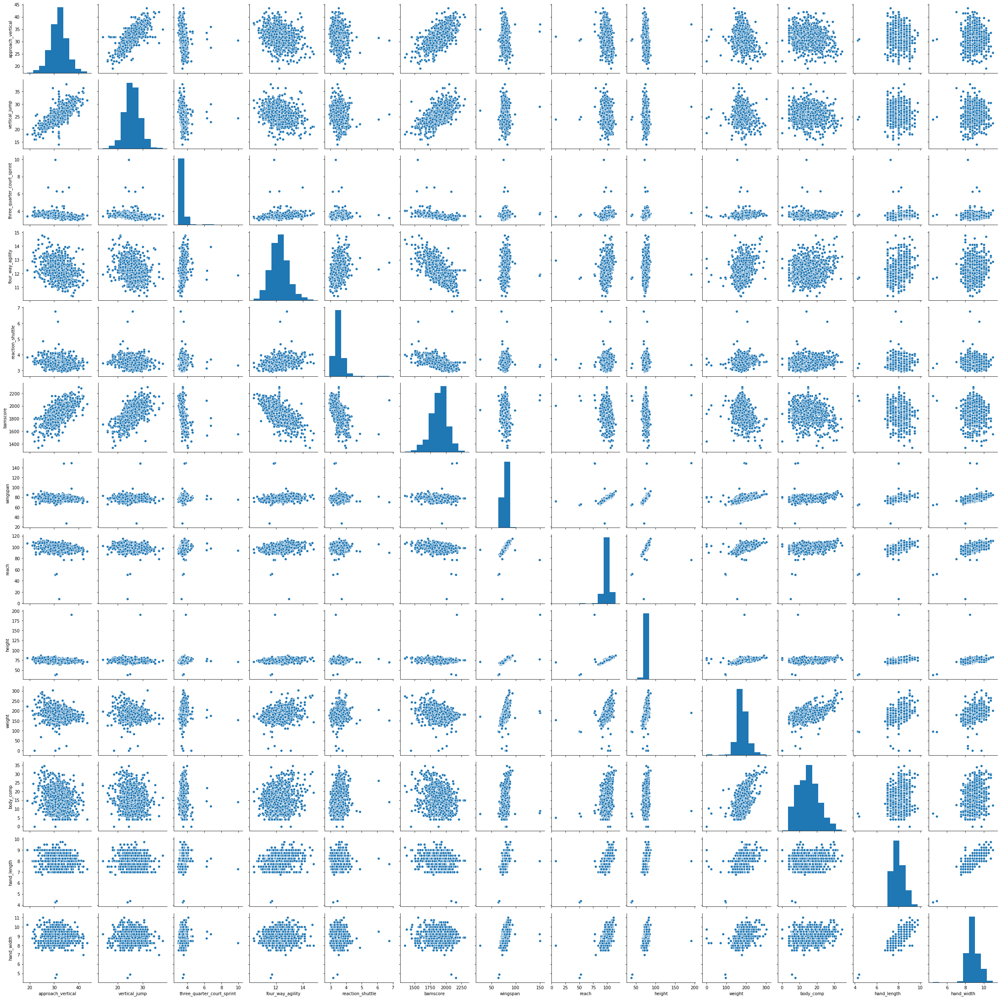

In [12]:
# First lets use the eye test and look at relationships in our data + identify multicollinearity.
sns.pairplot(df)

### Observations:
#### Top right column where points look like they are lining up - this means it could be a categorical variable
#### Diaganols shows us baseline normal distribution
#### Can see on reaction shuttle and 3/4 court sprint outlier because it's skewed to left

### What does bamscore look like? What is it?

In [13]:
df['bamscore'].describe(),

(count    1059.000000
 mean     1890.976326
 std       134.866028
 min      1343.000000
 25%      1811.000000
 50%      1899.000000
 75%      1981.000000
 max      2298.000000
 Name: bamscore, dtype: float64,)

Text(0, 0.5, 'Count')

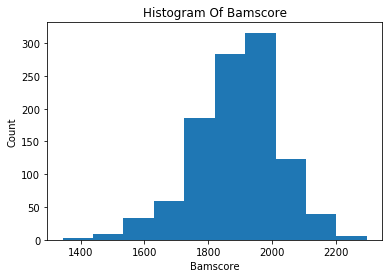

In [14]:
fig,ax = plt.subplots(1,1)
df['bamscore'].plot.hist(bins=10)
ax.set_title("Histogram Of Bamscore")
ax.set_xlabel('Bamscore')
ax.set_ylabel('Count')

### Observations:
#### BAMscore Range: [1343-2298]
#### BAMscore Min: [1343]
#### BAMscore Max: [2298]
#### - More above avg/good bamscores than poor

## Create BAM_score_rank
### Split bamscore into 5 ranks (1-5) and add it as a new column

#### - For visualization purposes + EDA only
#### - !! Don't forget to drop before saving notebook because bam_score_rank is a classifier and we are doing a regression !!
#### - In the future, if we decide to change this to a classification, then we can keep bam_score_rank and ranks for other factors

In [15]:
bam_mu = df['bamscore'].mean()
bam_std = df['bamscore'].std()

min95 = bam_mu-2*bam_std
max95 = bam_mu+2*bam_std


def get_rank_bam_score(bam):
    if bam > bam_mu+1*bam_std:
        return 5
    if bam > bam_mu:
        return 4
    if bam > bam_mu - bam_std:
        return 3
    if bam > bam_mu - 2*bam_std:
        return 2
    return 1

In [16]:
df['bam_score_rank'] = df['bamscore'].apply(get_rank_bam_score)
df.head()
# I ended up dropping this, but if I want to do a classification instead of regression, use bam_score_rank
# Instead of splitting data into 5 collections and then referencing a list, I will use bamscorerank

,approach_vertical,vertical_jump,three_quarter_court_sprint,four_way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width,bam_score_rank
0,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25,4
1,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75,3
2,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50,4
3,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25,4
4,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00,4


## BAM_SCORE_RANK

### 1 = Worst Bam Scores | 5 = Best Bam Scores

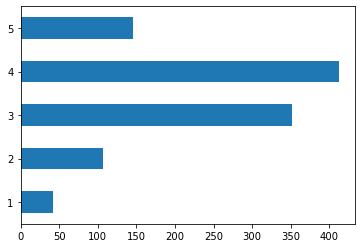

In [17]:
av_rank_bam_score = pd.value_counts(df['bam_score_rank'].values, sort=False)
av_rank_bam_score.plot.barh()

#### I wonder what the pairplot looks like if I split bamscore into 5 groups

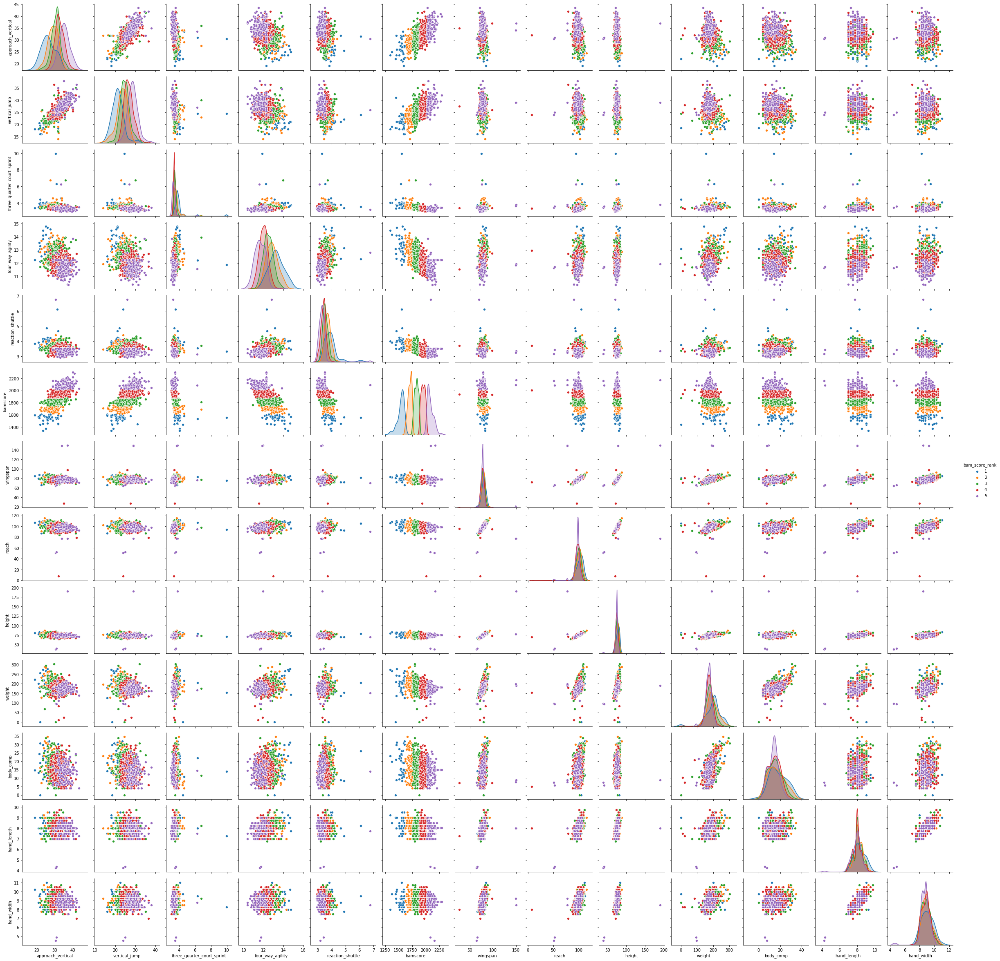

In [18]:
sns.pairplot(df, hue='bam_score_rank')
# hard to see but just gives us more insight + verifies that data makes generally makes sense
# https://seaborn.pydata.org/generated/seaborn.pairplot.html

## Next let's look at the relationship of each factor with respect to bam score
### I picked histograms + violin plots because:
#### - Gives us quick information to help us understand the data
#### - Outliers tend to stick out like a sore thumb
#### - Easy to look at and visualize

### ** Note my observations in comments **

## Approach Vertical

Text(0, 0.5, 'Count')

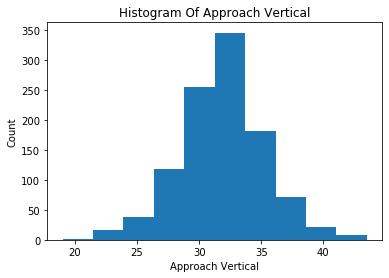

In [19]:
fig,ax = plt.subplots(1,1)
df['approach_vertical'].plot.hist(bins=10)
ax.set_title("Histogram Of Approach Vertical")
ax.set_xlabel('Approach Vertical')
ax.set_ylabel('Count')

In [20]:
fig = px.violin(df, y='approach_vertical', x='bam_score_rank',
                box=True, hover_data=df.columns, title='Approach Vertical with respect to Bam Score Rank')
fig.show()

## Vertical Jump

Text(0, 0.5, 'Count')

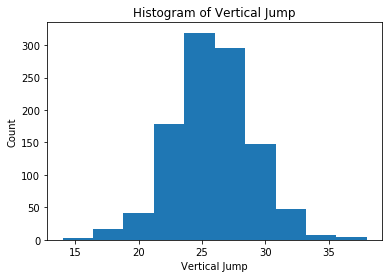

In [21]:
fig,ax = plt.subplots(1,1)
df['vertical_jump'].plot.hist(bins=10)
ax.set_title("Histogram of Vertical Jump")
ax.set_xlabel('Vertical Jump')
ax.set_ylabel('Count')

In [22]:
fig = px.violin(df, y='vertical_jump', x='bam_score_rank',
                box=True, hover_data=df.columns, title='Vertical Jump with respect to Bam Score Rank')
fig.show()

## 3/4 Court Sprint

Text(0, 0.5, 'Count')

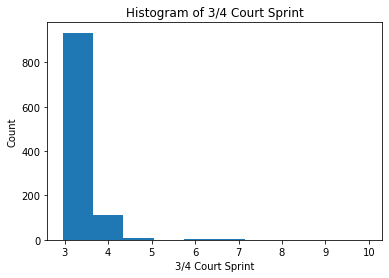

In [23]:
fig,ax = plt.subplots(1,1)
df['three_quarter_court_sprint'].plot.hist(bins=10)
ax.set_title("Histogram of 3/4 Court Sprint")
ax.set_xlabel('3/4 Court Sprint')
ax.set_ylabel('Count')

In [24]:
fig = px.violin(df, y='three_quarter_court_sprint', x='bam_score_rank',
                box=True, hover_data=df.columns, title='3/4 Court Sprint with respect to Bam Score Rank')
fig.show()

In [25]:
# Outliers Present

## 4 Way Agility

Text(0, 0.5, 'Count')

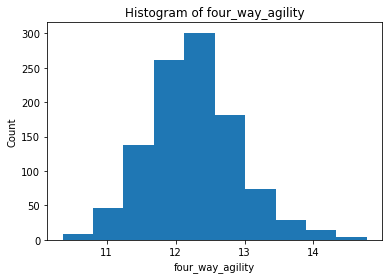

In [26]:
fig,ax = plt.subplots(1,1)
df['four_way_agility'].plot.hist(bins=10)
ax.set_title("Histogram of four_way_agility")
ax.set_xlabel('four_way_agility')
ax.set_ylabel('Count')

In [27]:
fig = px.violin(df, y='four_way_agility', x='bam_score_rank',
                box=True, hover_data=df.columns, title='four_way_agility with respect to Bam Score Rank')
fig.show()

In [28]:
# Outliers Present

## Reaction Shuttle

Text(0, 0.5, 'Count')

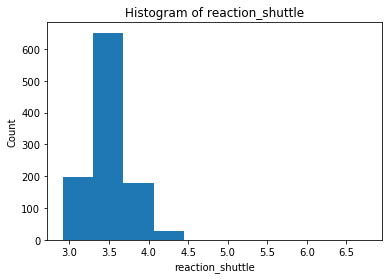

In [29]:
fig,ax = plt.subplots(1,1)
df['reaction_shuttle'].plot.hist(bins=10)
ax.set_title("Histogram of reaction_shuttle")
ax.set_xlabel('reaction_shuttle')
ax.set_ylabel('Count')

In [30]:
fig = px.violin(df, y='reaction_shuttle', x='bam_score_rank',
                box=True, hover_data=df.columns, title='Reaction Shuttle with respect to Bam Score Rank')
fig.show()

## Wingspan

Text(0, 0.5, 'Count')

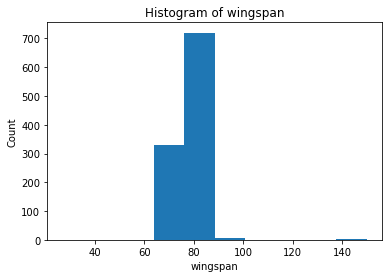

In [31]:
fig,ax = plt.subplots(1,1)
df['wingspan'].plot.hist(bins=10)
ax.set_title("Histogram of wingspan")
ax.set_xlabel('wingspan')
ax.set_ylabel('Count')

In [32]:
fig = px.violin(df, y='wingspan', x='bam_score_rank',
                box=True, hover_data=df.columns, title='wingspan with respect to Bam Score Rank')
fig.show()

## Reach

Text(0, 0.5, 'Count')

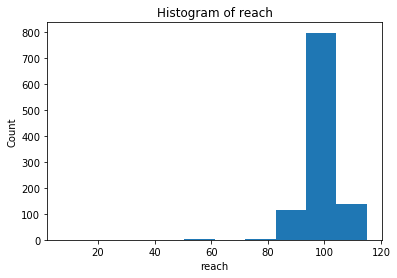

In [33]:
fig,ax = plt.subplots(1,1)
df['reach'].plot.hist(bins=10)
ax.set_title("Histogram of reach")
ax.set_xlabel('reach')
ax.set_ylabel('Count')

In [34]:
fig = px.violin(df, y='reach', x='bam_score_rank',
                box=True, hover_data=df.columns, title='reach with respect to Bam Score Rank')
fig.show()

## Height

Text(0, 0.5, 'Count')

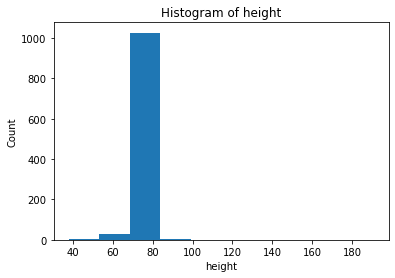

In [35]:
fig,ax = plt.subplots(1,1)
df['height'].plot.hist(bins=10)
ax.set_title("Histogram of height")
ax.set_xlabel('height')
ax.set_ylabel('Count')

In [36]:
fig = px.violin(df, y='height', x='bam_score_rank',
                box=True, hover_data=df.columns, title='height with respect to Bam Score Rank')
fig.show()

## Weight

Text(0, 0.5, 'Count')

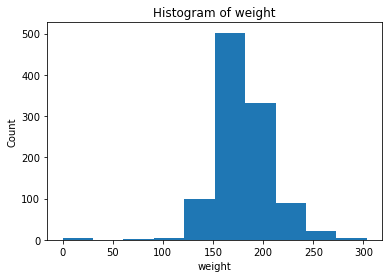

In [37]:
fig,ax = plt.subplots(1,1)
df['weight'].plot.hist(bins=10)
ax.set_title("Histogram of weight")
ax.set_xlabel('weight')
ax.set_ylabel('Count')

In [38]:
fig = px.violin(df, y='weight', x='bam_score_rank',
                box=True, hover_data=df.columns, title='weight with respect to Bam Score Rank')
fig.show()

## Body Comp

Text(0, 0.5, 'Count')

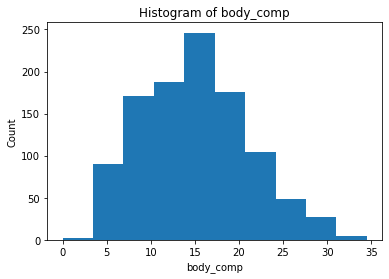

In [39]:
fig,ax = plt.subplots(1,1)
df['body_comp'].plot.hist(bins=10)
ax.set_title("Histogram of body_comp")
ax.set_xlabel('body_comp')
ax.set_ylabel('Count')

In [40]:
fig = px.violin(df, y='body_comp', x='bam_score_rank',
                box=True, hover_data=df.columns, title='body_comp with respect to Bam Score Rank')
fig.show()

In [41]:
# Outliers Present, has 0 values. Replace with mean after EDA

## Hand Length

Text(0, 0.5, 'Count')

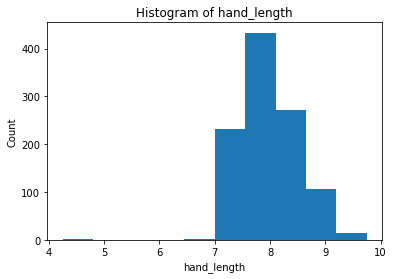

In [42]:
fig,ax = plt.subplots(1,1)
df['hand_length'].plot.hist(bins=10)
ax.set_title("Histogram of hand_length")
ax.set_xlabel('hand_length')
ax.set_ylabel('Count')

In [43]:
fig = px.violin(df, y='hand_length', x='bam_score_rank',
                box=True, hover_data=df.columns, title='hand_length with respect to Bam Score Rank')
fig.show()

## Hand Width

Text(0, 0.5, 'Count')

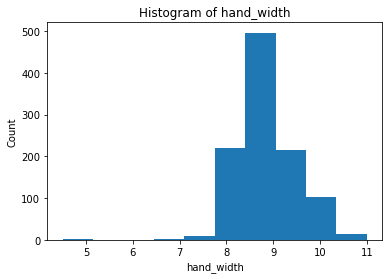

In [44]:
fig,ax = plt.subplots(1,1)
df['hand_width'].plot.hist(bins=10)
ax.set_title("Histogram of hand_width")
ax.set_xlabel('hand_width')
ax.set_ylabel('Count')

In [45]:
fig = px.violin(df, y='hand_width', x='bam_score_rank',
                box=True, hover_data=df.columns, title='hand_width with respect to Bam Score Rank')
fig.show()

# 3) Find + Fix Outliers

In [46]:
# Can redo in future this using axes example - I prefer to do my EDA step by step
## https://python.astrotech.io/matplotlib/multiple-figures.html
## https://matplotlib.org/stable/gallery/lines_bars_and_markers/simple_plot.html

In [47]:
# I noticed weight and body comp had at least 1 value of 0. So I want to locate these and fix them (replace mean)
# Will do this after split

In [48]:
df.describe()

,approach_vertical,vertical_jump,three_quarter_court_sprint,four_way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width,bam_score_rank
count,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000
mean,31.829615,25.860157,3.467047,12.247189,3.505243,1890.976326,78.089797,98.714180,75.094195,180.735820,14.979496,8.049381,8.876189,3.483475
std,3.423395,3.065653,0.335502,0.652726,0.273783,134.866028,5.143227,5.824608,5.128197,28.002496,6.052069,0.533210,0.638452,0.982099
min,19.000000,14.000000,2.950000,10.359000,2.914000,1343.000000,27.000000,7.500000,37.875000,0.000000,0.000000,4.250000,4.500000,1.000000
25%,30.000000,24.000000,3.339500,11.806000,3.348000,1811.000000,75.500000,96.000000,72.750000,165.200000,10.400000,7.750000,8.500000,3.000000
50%,31.829615,25.860157,3.424000,12.244000,3.492000,1899.000000,78.000000,98.714180,75.000000,179.500000,14.979496,8.000000,8.876189,4.000000
75%,34.000000,28.000000,3.537500,12.658000,3.634000,1981.000000,80.500000,102.000000,77.250000,195.000000,18.900000,8.500000,9.250000,4.000000
max,43.500000,38.000000,9.954000,14.775000,6.759000,2298.000000,150.000000,115.000000,190.700000,303.400000,34.500000,9.750000,11.000000,5.000000


In [49]:
# df.loc[(df.weight == 0)]
# df.loc[(df.body_comp == 0)]
# to use in modeling notebook to prove why we need to replace 0 in weight and body comp

In [50]:
# Replace these with mean now
df.mean()

approach_vertical               31.829615
vertical_jump                   25.860157
three_quarter_court_sprint       3.467047
four_way_agility                12.247189
reaction_shuttle                 3.505243
bamscore                      1890.976326
wingspan                        78.089797
reach                           98.714180
height                          75.094195
weight                         180.735820
body_comp                       14.979496
hand_length                      8.049381
hand_width                       8.876189
bam_score_rank                   3.483475
dtype: float64

In [51]:
df
# Fix 0 outliers

,approach_vertical,vertical_jump,three_quarter_court_sprint,four_way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width,bam_score_rank
0,33.500000,28.500000,3.376000,11.471000,3.669000,2003.000000,72.750000,94.00000,70.000000,174.40000,9.800000,7.500000,8.250000,4
1,30.500000,21.500000,3.486000,12.114000,3.355000,1865.000000,82.000000,104.50000,79.500000,188.40000,21.900000,7.500000,8.750000,3
2,37.000000,31.000000,3.230000,12.036000,3.562000,2005.000000,81.500000,99.00000,74.000000,196.50000,13.900000,9.000000,9.500000,4
3,29.000000,23.000000,3.370000,12.509000,3.173000,1902.000000,79.500000,101.00000,77.500000,205.00000,10.600000,8.250000,9.250000,4
4,31.000000,26.000000,3.389000,12.724000,3.316000,1903.000000,77.000000,101.50000,78.000000,180.00000,15.400000,8.000000,10.000000,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1054,36.000000,31.000000,3.424000,12.654000,3.635000,1917.000000,72.000000,88.00000,68.250000,147.40000,7.900000,8.000000,8.500000,4
1055,31.500000,26.500000,3.256000,11.136000,3.343000,2029.000000,74.000000,91.50000,68.000000,172.10000,23.400000,7.000000,8.500000,5
1056,31.829615,25.860157,3.467047,12.247189,3.505243,1890.976326,78.089797,98.71418,75.094195,180.73582,14.979496,8.049381,8.876189,3
1057,31.829615,25.860157,3.467047,12.247189,3.505243,1890.976326,78.089797,98.71418,75.094195,180.73582,14.979496,8.049381,8.876189,3


In [52]:
df['body_comp'].replace(to_replace=0, value = df['body_comp'].mean(), inplace = True)

In [53]:
df['weight'].replace(to_replace=0, value = df['weight'].mean(), inplace = True)

In [54]:
df.drop(columns=['bam_score_rank'],inplace=True)

In [55]:
df.describe()

,approach_vertical,vertical_jump,three_quarter_court_sprint,four_way_agility,reaction_shuttle,bamscore,wingspan,reach,height,weight,body_comp,hand_length,hand_width
count,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000,1059.000000
mean,31.829615,25.860157,3.467047,12.247189,3.505243,1890.976326,78.089797,98.714180,75.094195,181.077153,15.007786,8.049381,8.876189
std,3.423395,3.065653,0.335502,0.652726,0.273783,134.866028,5.143227,5.824608,5.128197,26.875151,6.016857,0.533210,0.638452
min,19.000000,14.000000,2.950000,10.359000,2.914000,1343.000000,27.000000,7.500000,37.875000,10.300000,4.000000,4.250000,4.500000
25%,30.000000,24.000000,3.339500,11.806000,3.348000,1811.000000,75.500000,96.000000,72.750000,165.250000,10.400000,7.750000,8.500000
50%,31.829615,25.860157,3.424000,12.244000,3.492000,1899.000000,78.000000,98.714180,75.000000,179.600000,14.979496,8.000000,8.876189
75%,34.000000,28.000000,3.537500,12.658000,3.634000,1981.000000,80.500000,102.000000,77.250000,195.000000,18.900000,8.500000,9.250000
max,43.500000,38.000000,9.954000,14.775000,6.759000,2298.000000,150.000000,115.000000,190.700000,303.400000,34.500000,9.750000,11.000000


# 4) Save Cleaned Data as csv

In [56]:
df.to_csv('bam_data.csv',index = None)

In [57]:
# Index = None - do this to not have blank index/unamed column